In [1]:
# Gerekli kütüphaneleri import edelim
import os
from pathlib import Path
import os.path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
import matplotlib.cm as cm
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

import tensorflow as tf

In [2]:
# Görüntü dosyalarının bulunduğu dizini belirleyin
image_dir = Path('Fish_Dataset')

filepaths = list(image_dir.glob('**/*.png'))  # Tüm resimleri bul
labels = [p.parent.name for p in filepaths]   # klasör adından label al

image_df = pd.DataFrame({
    'Filepath': [str(p) for p in filepaths],
    'Label': labels
})

# GT ile bitenleri çıkarma
image_df = image_df[~image_df['Label'].str.endswith('GT')]

print("Toplam görüntü:", len(image_df))
image_df.head()

Toplam görüntü: 9000


,Filepath,Label
0,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,Black Sea Sprat
1,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,Black Sea Sprat
2,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,Black Sea Sprat
3,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,Black Sea Sprat
4,Fish_Dataset\Black Sea Sprat\Black Sea Sprat\0...,Black Sea Sprat


In [3]:
# DataFrame'i karıştırın ve indeksi sıfırlayın
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Sonucu gösterin
image_df.head(3)

,Filepath,Label
0,Fish_Dataset\Trout\Trout\00239.png,Trout
1,Fish_Dataset\Sea Bass\Sea Bass\00214.png,Sea Bass
2,Fish_Dataset\Hourse Mackerel\Hourse Mackerel\0...,Hourse Mackerel


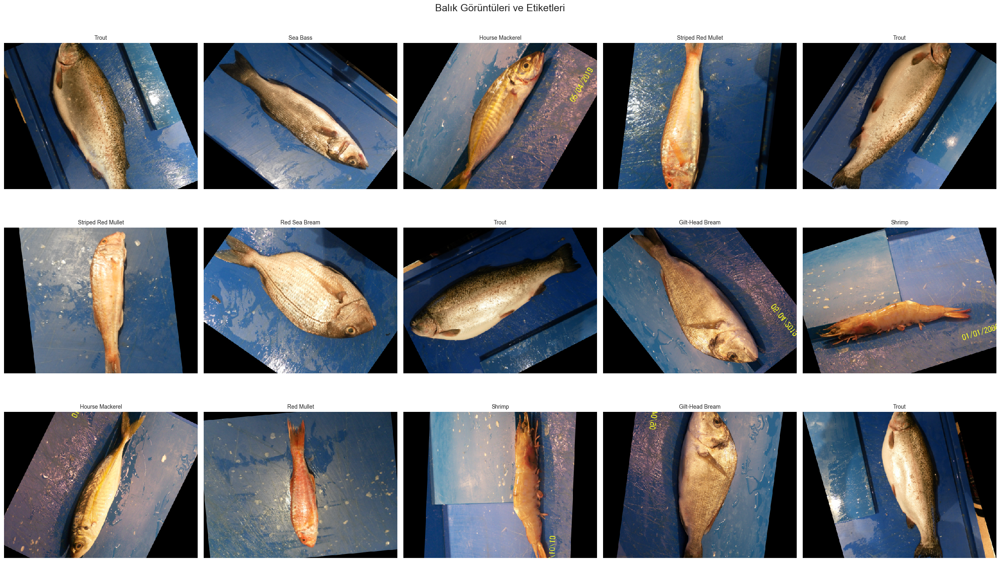

In [4]:
# Veri setinden etiketleriyle birlikte 20 resim görüntüleyin

fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15))
for i, ax in enumerate(axes.flat[:15]):  # İlk 40 resim için
    image = plt.imread(image_df.Filepath.iloc[i])
    ax.imshow(image, interpolation='none')
    ax.set_title(image_df.Label.iloc[i], fontsize=10)
    ax.axis('off')

plt.suptitle('Balık Görüntüleri ve Etiketleri', fontsize=18)
plt.tight_layout()
plt.show()

In [5]:
train_df, test_df = train_test_split(
    image_df,
    train_size=0.8,   # %80 eğitim
    test_size=0.2,    # %20 test
    shuffle=True,
    random_state=1
)

In [6]:
len(train_df), len(test_df)

(7200, 1800)

In [7]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
    validation_split=0.2
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
)

In [8]:
image_size = 224
image_plane = 3
batch = 32
epoch = 15
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(image_size, image_size),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(image_size, image_size),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(image_size, image_size),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch,
    shuffle=False
)

Found 5760 validated image filenames belonging to 9 classes.
Found 1440 validated image filenames belonging to 9 classes.
Found 1800 validated image filenames belonging to 9 classes.


In [9]:
# Eğitilmiş Modeli Yükle
pretrained_model = tf.keras.applications.MobileNetV2(
    input_shape=(image_size, image_size, image_plane ),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

pretrained_model.trainable = False

In [10]:
from tensorflow.keras.callbacks import ModelCheckpoint
#modeli otomatik olarak kaydedilsin
checkpoint = ModelCheckpoint(
    filepath='best_model.keras',   # Kaydedilecek dosya adı
    monitor='val_loss',         # En iyi modeli val_loss'a göre seç
    save_best_only=True,        # Sadece en iyisini kaydet
    mode='min'
)
#Callbacks tanımla
callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6
    ),
    checkpoint
]

In [11]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(9, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=epoch,
    callbacks=callbacks
)

Epoch 1/15
180/180 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.9528 - loss: 0.1670 - val_accuracy: 1.0000 - val_loss: 0.0108 - learning_rate: 0.0010
Epoch 2/15
180/180 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - accuracy: 0.9991 - loss: 0.0080 - val_accuracy: 0.9993 - val_loss: 0.0053 - learning_rate: 0.0010
Epoch 3/15
180/180 ━━━━━━━━━━━━━━━━━━━━ 178s 987ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.9986 - val_loss: 0.0058 - learning_rate: 0.0010
Epoch 4/15
180/180 ━━━━━━━━━━━━━━━━━━━━ 178s 990ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.9965 - val_loss: 0.0074 - learning_rate: 0.0010
Epoch 5/15
180/180 ━━━━━━━━━━━━━━━━━━━━ 179s 991ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.9993 - val_loss: 0.0028 - learning_rate: 0.0010
Epoch 6/15
180/180 ━━━━━━━━━━━━━━━━━━━━ 178s 989ms/step - accuracy: 0.9998 - loss: 0.0012 - val_accuracy: 0.9993 - val_loss: 0.0022 - learning_rate: 0.0010
Epoch 7/15
180/180 ━━━━━━━━━━━━━━━━━━━━ 178s 988ms/step - accuracy: 0.

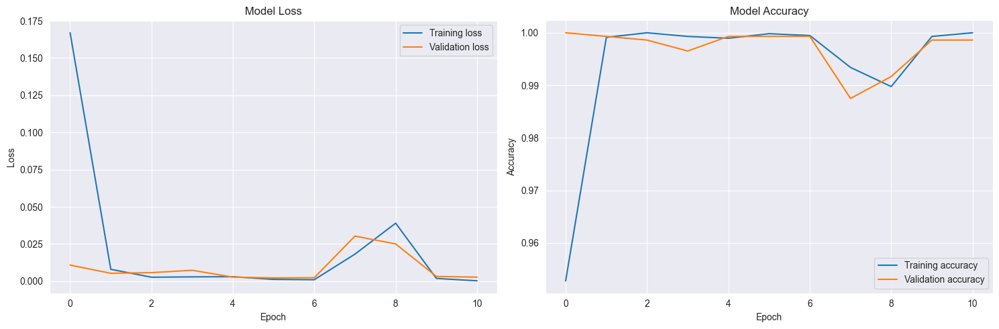


En İyi Metrik Değerleri:
En iyi validation accuracy: 1.0000
En iyi validation loss: 0.0022
En iyi training accuracy: 1.0000
En iyi training loss: 0.0003

Overfitting Analizi:
Model iyi generalize ediyor.


In [12]:
# Eğitim metriklerini görselleştirme fonksiyonu
def plot_training_metrics(history):
    metrics = ['loss', 'accuracy']
    plt.figure(figsize=(15, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 2, i+1)

        plt.plot(history.history[metric], label=f'Training {metric}')
        plt.plot(history.history[f'val_{metric}'], label=f'Validation {metric}')

        plt.title(f'Model {metric.capitalize()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.capitalize())
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

    # En iyi değerleri yazdır
    best_val_acc = max(history.history['val_accuracy'])
    best_val_loss = min(history.history['val_loss'])
    best_acc = max(history.history['accuracy'])
    best_loss = min(history.history['loss'])

    print("\nEn İyi Metrik Değerleri:")
    print(f"En iyi validation accuracy: {best_val_acc:.4f}")
    print(f"En iyi validation loss: {best_val_loss:.4f}")
    print(f"En iyi training accuracy: {best_acc:.4f}")
    print(f"En iyi training loss: {best_loss:.4f}")

    # Overfitting analizi
    final_acc = history.history['accuracy'][-1]
    final_val_acc = history.history['val_accuracy'][-1]
    acc_diff = final_acc - final_val_acc

    print("\nOverfitting Analizi:")
    if acc_diff > 0.05:  # %5'ten fazla fark varsa
        print(f"Model overfitting gösteriyor. Training ve validation accuracy arasında {acc_diff:.4f} fark var.")
    else:
        print("Model iyi generalize ediyor.")

# Model eğitiminden sonra metrikleri görselleştir
plot_training_metrics(history)

In [13]:
# Ayrıntılı epoch analizi
def print_epoch_analysis(history):
    print("\nEpoch Bazlı Analiz:")
    metrics = ['loss', 'accuracy', 'val_loss', 'val_accuracy']

    for epoch, values in enumerate(zip(*[history.history[metric] for metric in metrics]), 1):
        train_loss, train_acc, val_loss, val_acc = values
        print(f"\nEpoch {epoch}:")
        print(f"Training   - Loss: {train_loss:.4f}, Accuracy: {train_acc:.4f}")
        print(f"Validation - Loss: {val_loss:.4f}, Accuracy: {val_acc:.4f}")

        # İyileşme/Kötüleşme analizi
        if epoch > 1:
            prev_val_loss = history.history['val_loss'][epoch-2]
            prev_val_acc = history.history['val_accuracy'][epoch-2]

            loss_change = ((val_loss - prev_val_loss) / prev_val_loss) * 100
            acc_change = ((val_acc - prev_val_acc) / prev_val_acc) * 100

            print(f"Değişim - Loss: {loss_change:+.2f}%, Accuracy: {acc_change:+.2f}%")

# Epoch analizini yazdır
print_epoch_analysis(history)


Epoch Bazlı Analiz:

Epoch 1:
Training   - Loss: 0.1670, Accuracy: 0.9528
Validation - Loss: 0.0108, Accuracy: 1.0000

Epoch 2:
Training   - Loss: 0.0080, Accuracy: 0.9991
Validation - Loss: 0.0053, Accuracy: 0.9993
Değişim - Loss: -50.91%, Accuracy: -0.07%

Epoch 3:
Training   - Loss: 0.0027, Accuracy: 1.0000
Validation - Loss: 0.0058, Accuracy: 0.9986
Değişim - Loss: +8.16%, Accuracy: -0.07%

Epoch 4:
Training   - Loss: 0.0029, Accuracy: 0.9993
Validation - Loss: 0.0074, Accuracy: 0.9965
Değişim - Loss: +27.95%, Accuracy: -0.21%

Epoch 5:
Training   - Loss: 0.0030, Accuracy: 0.9990
Validation - Loss: 0.0028, Accuracy: 0.9993
Değişim - Loss: -62.64%, Accuracy: +0.28%

Epoch 6:
Training   - Loss: 0.0012, Accuracy: 0.9998
Validation - Loss: 0.0022, Accuracy: 0.9993
Değişim - Loss: -19.83%, Accuracy: +0.00%

Epoch 7:
Training   - Loss: 0.0010, Accuracy: 0.9995
Validation - Loss: 0.0024, Accuracy: 0.9993
Değişim - Loss: +7.33%, Accuracy: +0.00%

Epoch 8:
Training   - Loss: 0.0182, Accura

In [14]:
def best_worst_epoch_report(history):
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    train_loss = history.history['loss']

    # En iyi epoch (en yüksek val_accuracy)
    best_epoch_acc = val_acc.index(max(val_acc)) + 1
    best_acc_value = max(val_acc)

    # En kötü epoch (en düşük val_accuracy)
    worst_epoch_acc = val_acc.index(min(val_acc)) + 1
    worst_acc_value = min(val_acc)

    # En düşük validation loss epochu (en iyi loss)
    best_epoch_loss = val_loss.index(min(val_loss)) + 1
    best_loss_value = min(val_loss)

    print("\n📌 EN İYİ / EN KÖTÜ EPOCH RAPORU")
    print("----------------------------------")
    print(f"🔥 En iyi validation accuracy epoch: {best_epoch_acc}")
    print(f"   Değer: {best_acc_value:.4f}")

    print(f"\n❗ En kötü validation accuracy epoch: {worst_epoch_acc}")
    print(f"   Değer: {worst_acc_value:.4f}")

    print(f"\n🎯 En düşük validation loss epoch: {best_epoch_loss}")
    print(f"   Değer: {best_loss_value:.4f}")

    # Dilersen tüm değerleri tek satırda gösterebilirsin
    print("\n🔎 Ayrıntılı En İyi Epoch Değerleri:")
    print(f"Training Accuracy:  {train_acc[best_epoch_acc-1]:.4f}")
    print(f"Training Loss:      {train_loss[best_epoch_acc-1]:.4f}")
    print(f"Validation Accuracy:{val_acc[best_epoch_acc-1]:.4f}")
    print(f"Validation Loss:    {val_loss[best_epoch_acc-1]:.4f}")

# Fonksiyonu çalıştır
best_worst_epoch_report(history)


📌 EN İYİ / EN KÖTÜ EPOCH RAPORU
----------------------------------
🔥 En iyi validation accuracy epoch: 1
   Değer: 1.0000

❗ En kötü validation accuracy epoch: 8
   Değer: 0.9875

🎯 En düşük validation loss epoch: 6
   Değer: 0.0022

🔎 Ayrıntılı En İyi Epoch Değerleri:
Training Accuracy:  0.9528
Training Loss:      0.1670
Validation Accuracy:1.0000
Validation Loss:    0.0108


In [15]:
# Modelin Performansı
results = model.evaluate(test_images, verbose=0)

print("Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

Test Loss: 0.00513
Test Accuracy: 99.89%


In [16]:
# Predict the label of the test_images- Test görüntülerinin etiketini tahmin et
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label - Etiket haritasi
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

57/57 ━━━━━━━━━━━━━━━━━━━━ 52s 867ms/step
The first 5 predictions: ['Gilt-Head Bream', 'Shrimp', 'Black Sea Sprat', 'Red Sea Bream', 'Striped Red Mullet']


In [17]:
y_test = list(test_df.Label)

print(classification_report(y_test, pred))

                    precision    recall  f1-score   support

   Black Sea Sprat       1.00      1.00      1.00       190
   Gilt-Head Bream       1.00      1.00      1.00       188
   Hourse Mackerel       1.00      1.00      1.00       205
        Red Mullet       0.99      1.00      1.00       194
     Red Sea Bream       1.00      1.00      1.00       201
          Sea Bass       1.00      1.00      1.00       222
            Shrimp       0.99      1.00      1.00       191
Striped Red Mullet       1.00      0.99      1.00       216
             Trout       1.00      1.00      1.00       193

          accuracy                           1.00      1800
         macro avg       1.00      1.00      1.00      1800
      weighted avg       1.00      1.00      1.00      1800



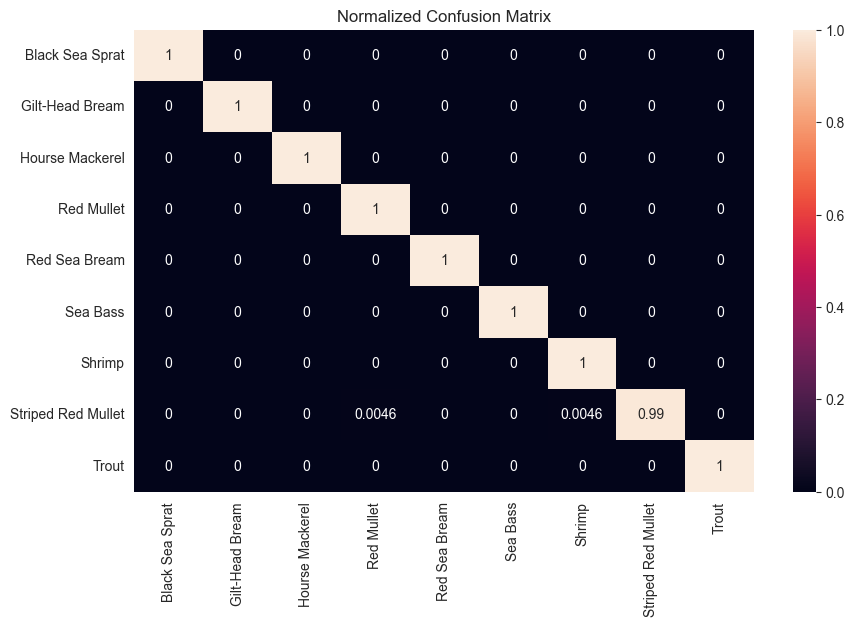

In [18]:
cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize=(10, 6))
sns.heatmap(cf_matrix, annot=True, xticklabels=sorted(set(y_test)), yticklabels=sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

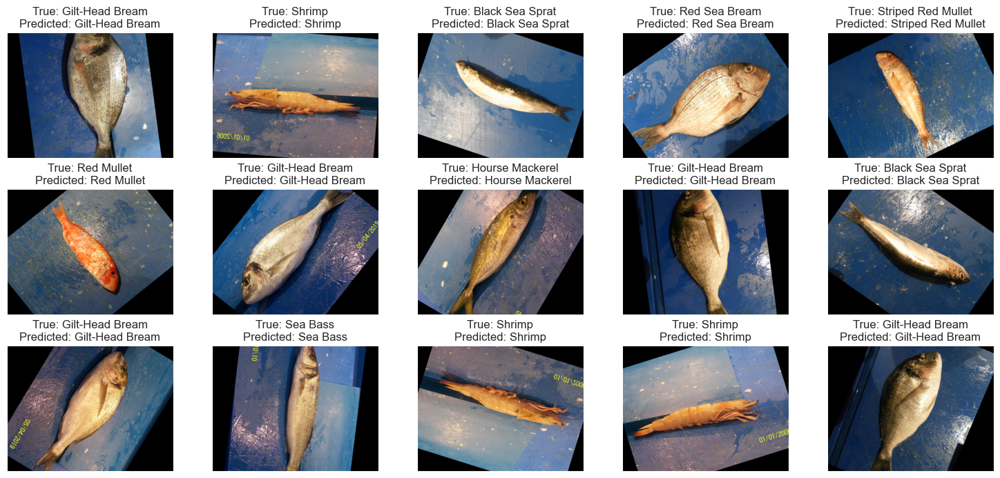

In [22]:
# Display 15 picture of the dataset with their labels
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 7),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [28]:
# Resmi yükleyip diziye çeviren fonksiyon
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

# Grad-CAM ısı haritasını oluşturan fonksiyon
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Isı haritasını kaydedip gösteren fonksiyon
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    heatmap = np.uint8(255 * heatmap)
    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    superimposed_img.save(cam_path)

    return cam_path

In [33]:
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array


In [34]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    return heatmap.numpy()


In [35]:
from matplotlib import colormaps

def save_and_display_gradcam(img_path, heatmap, alpha=0.4):
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    heatmap = np.uint8(255 * heatmap)

    jet = colormaps["jet"]
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    return superimposed_img


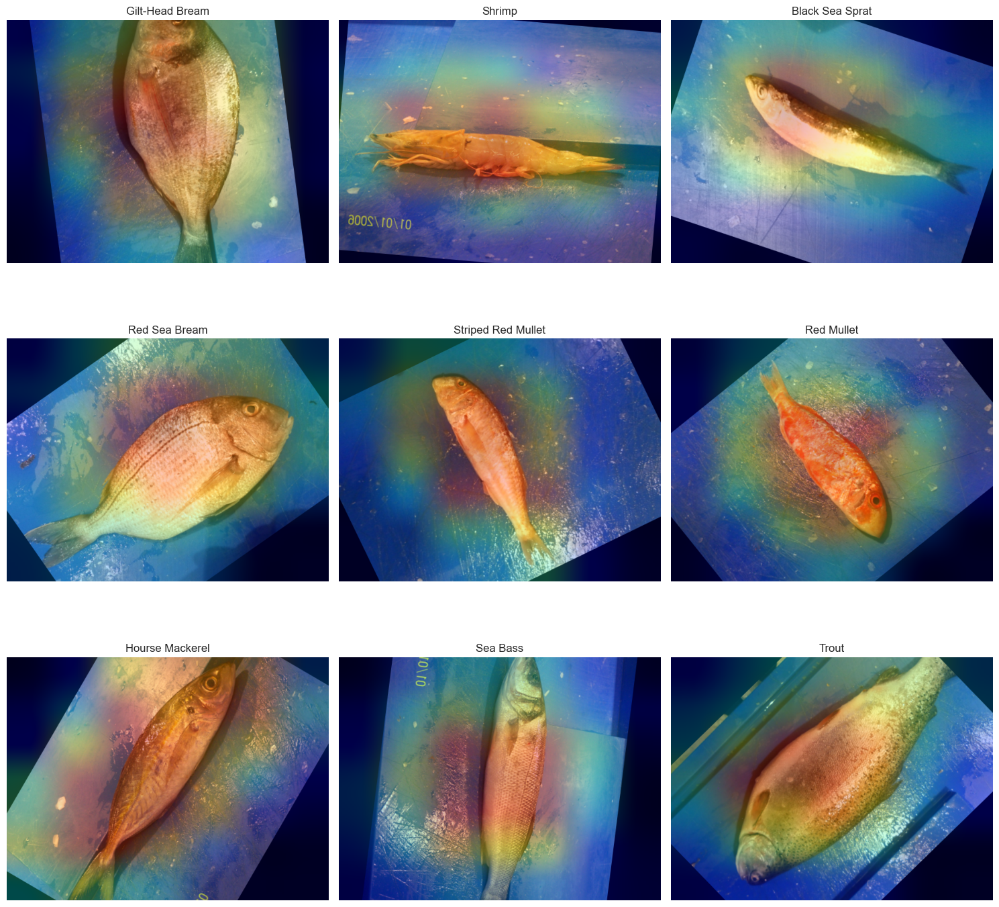

In [36]:
last_conv_layer_name = "Conv_1"
img_size = (224, 224)

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

used_labels = set()
idx = 0

for i in range(len(test_df)):
    label = test_df.Label.iloc[i]

    if label in used_labels:
        continue

    img_path = test_df.Filepath.iloc[i]
    img_array = get_img_array(img_path, img_size)
    img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    gradcam_img = save_and_display_gradcam(img_path, heatmap)

    axes[idx].imshow(gradcam_img)
    axes[idx].set_title(label)
    axes[idx].axis("off")

    used_labels.add(label)
    idx += 1

    if idx == 9:
        break

plt.tight_layout()
plt.show()
